<a href="https://colab.research.google.com/github/sushil1016/Mytest/blob/master/Sight2Sound_CaptioningTool_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Project Workflow Summary**

* Utilized a pre-trained **ResNet-50** model as the visual feature extractor by removing its final classification layer.
* Extracted deep feature vectors from **8,000 images** of the **Flickr8k** dataset using the modified ResNet-50 architecture.
* Parsed and cleaned the **Flickr8k caption dataset** to generate multiple captions per image, followed by building a vocabulary based on word frequency.
* Encoded captions into numerical sequences, including special tokens (e.g., `START` and `END`) to indicate sentence boundaries.
* Created a paired **training dataset** consisting of image features and their corresponding encoded captions.
* Designed a decoder using **stacked LSTM layers** to learn temporal patterns in the caption sequences.
* Trained the image captioning model on the generated dataset and evaluated its performance on **unseen test images** to verify generalization.


**Objective:**

Image Captioning : Image Captioning is the process of generating textual description of an image. It uses both Natural Language Processing and Computer Vision to generate the captions. The dataset will be in the form [image → captions]. The dataset consists of input images and their corresponding output captions.

**Encoder**

The Convolutional Neural Network(CNN) can be thought of as an encoder. The input image is given to CNN to extract the features. The last hidden state of the CNN is connected to the Decoder.

**Decoder**

The Decoder is a Recurrent Neural Network(RNN) which does language modelling up to the word level. The first time step receives the encoded output from the encoder and also the <START> vector.



Read the pickle or token file  (https://www.kaggle.com/waelboussbat/flickr8ksau) {***filename***: Flickr8k.token.txt => set_0.pkl} and convert the data into the correct format which could be used for ML model.

Pickle file contains the image id and the text associated with the image.

Eg: '319847657_2c40e14113.jpg#0\tA girl in a purple shirt hold a pillow .
Each image can have multiple captions.
1. 319847657_2c40e14113.jpg -> image name
2. #0 -> Caption ID
3. \t  -> separator between Image name and Image Caption
A girl in a purple shirt hold a pillow . -> Image Caption

Corresponding image wrt image name can be found in the image dataset folder.
Image dataset Folder : https://www.kaggle.com/waelboussbat/flickr8ksau/
Images folder can be extracted from above location


* Use Pretrained Resnet-50 model trained on ImageNet dataset (available publicly on google) for image feature extraction.

* Take a random image from google and generate caption for that image.


🔁 Example Process
Image of cat on couch →
ResNet50 gives 2048 features →
“START” word is fed →
Model predicts: “A”
Then: “A cat” → model predicts: “sitting”
Then: “A cat sitting” → model predicts: “on”
... until it says: “END”

In [140]:
#!pip install cv2
!pip install opencv-python

import numpy as np
import pandas as pd
import cv2
import os
from glob import glob

In [67]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("adityajn105/flickr8k")

print("Path to dataset files:", path)
#from google.colab import drive
#drive.mount('/content/drive')

Path to dataset files: /kaggle/input/flickr8k


**Download MSCOCO Dataset**

In [ ]:
# Download COCO 2017 subset dataset
coco_path = kagglehub.dataset_download("arunmohan003/coco2017-dataset")

print("MSCOCO subset downloaded at:", coco_path)

import json
import os

# Load MSCOCO captions JSON
captions_file = os.path.join(coco_path, "annotations", "captions_train2017.json")
with open(captions_file, 'r') as f:
    data = json.load(f)

# Create dictionary: image_id → list of captions
coco_captions = {}
for item in data['annotations']:
    image_id = f"{item['image_id']:012d}.jpg"
    caption = item['caption'].strip()
    coco_captions.setdefault(image_id, []).append(caption)

# Sample output
for k in list(coco_captions.keys())[:3]:
    print(k, ":", coco_captions[k])

subset_captions = dict(list(coco_captions.items())[:5000])



# **Image Preprocessing**
1. "Flicker8k_Dataset" must contain all the image files without subfoldering
2. Load Images
3. Plot sample images

#### Reading images

In [68]:
import glob
images_path = '/kaggle/input/flickr8k/Images/'
images = glob.glob(images_path+'*.jpg')
len(images)

8091

#### Showing 5 images name

In [69]:
images[:5]

['/kaggle/input/flickr8k/Images/3226254560_2f8ac147ea.jpg',
 '/kaggle/input/flickr8k/Images/214543992_ce6c0d9f9b.jpg',
 '/kaggle/input/flickr8k/Images/2366643786_9c9a830db8.jpg',
 '/kaggle/input/flickr8k/Images/3368819708_0bfa0808f8.jpg',
 '/kaggle/input/flickr8k/Images/2190227737_6e0bde2623.jpg']

#### Plotting 4 images from the image dataset

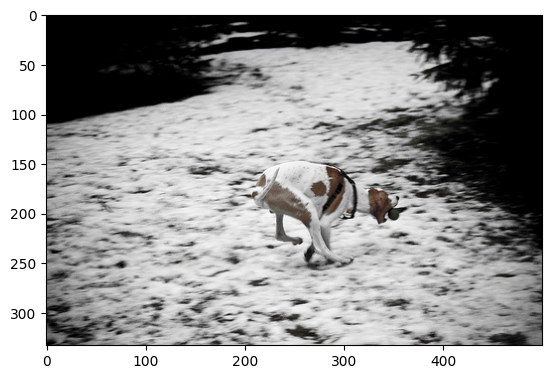

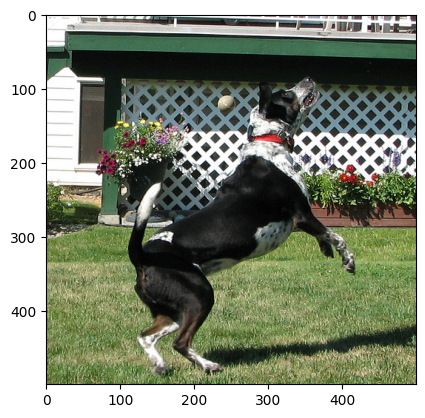

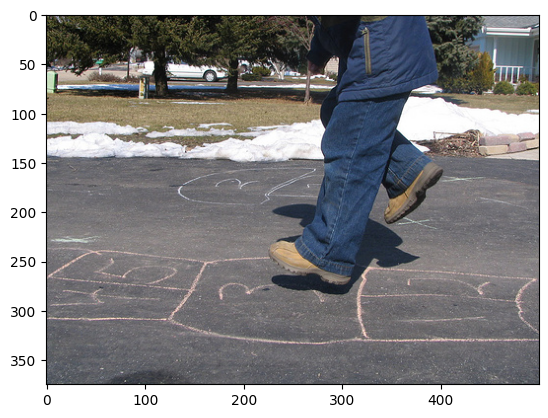

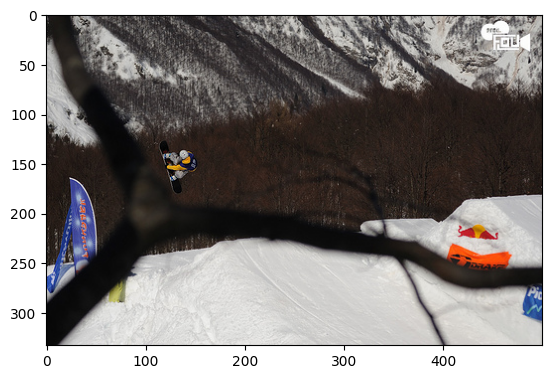

In [70]:
import matplotlib.pyplot as plt

for i in range(4):
    plt.figure()
    img = cv2.imread(images[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)

# **ResNet50 Pretrained Model**
1. Using ResNet50 Model to extract image features
2. Create ResNet50 instacnce
3. Create keras Model using ResNet50
4. Extract feature from images

##### Create resnet50 instance

In [107]:
!pip install tensorflow
from tensorflow.keras.applications import ResNet50

# incept_model = ResNet50(include_top=True)
img_width, img_height = 224, 224
incept_model = ResNet50(weights='imagenet',
                      include_top=False,
                      pooling='avg',
                      input_shape=(img_height, img_width, 3))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


##### Create model using keras

In [108]:
from tensorflow.keras.models import Model
last = incept_model.layers[-2].output #second last layer of the model
modele = Model(inputs = incept_model.input,outputs = last) #Gives the output from the second last layer, not the final prediction layer.
modele.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

##### Extract image features

In [109]:
from keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input

images_features = {}
count = 0
for i in images:
    img = image.load_img(i, target_size=(img_width, img_height)) #size= 224*224 expected by RestNet50
    img_data = image.img_to_array(img) #Converts the image into a NumPy array (i.e., raw pixel values).
    img_data = np.expand_dims(img_data, axis=0) #Adds an extra dimension to make it a batch of 1 image
    img_data = preprocess_input(img_data) #Preprocesses the image (like normalizing pixel values) to match the format ResNet50 was trained on.
    #predict the result
    cnn_feature = incept_model.predict(img_data,verbose=0) #Feeds the image into the pretrained ResNet50 model.
    images_features[i.split('/')[-1]] = cnn_feature #Stores the feature vector in the dictionary using the image filename as the key.

    #count += 1
    #if count > 2500:
    #    break

In [74]:
len(images_features)

8091

**Load Features for MSCOCCO images**

In [ ]:
mscoco_images_dir = os.path.join(mscoco_dir, "train2017")

from keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input

def extract_features_from_images(image_dir, image_keys, limit=5000):
    features = {}
    count = 0

    for img_name in image_keys:
        img_path = os.path.join(image_dir, img_name)
        if not os.path.exists(img_path): continue

        img = image.load_img(img_path, target_size=(224, 224))
        img_data = image.img_to_array(img)
        img_data = np.expand_dims(img_data, axis=0)
        img_data = preprocess_input(img_data)

        features[img_name] = incept_model.predict(img_data, verbose=0)

        count += 1
        if count >= limit:
            break

    return features

mscoco_features = extract_features_from_images(mscoco_images_dir, mscoco_captions.keys(), limit=5000)


# **Preprocess .pkl File for captions**
It reads caption data from the Flickr8k dataset and converts it into a Python dictionary, then saves it as a .pkl (pickle) file for later use.

In [123]:
import pickle

# Path to your downloaded file
input_txt_path = "/content/Flickr8k.token.txt"

# Parse and convert to dictionary
captions_dict = {}
with open(input_txt_path, "r", encoding="utf-8") as f:
    for line in f:
        if '\t' in line:
            img_id_full, caption = line.strip().split('\t', 1)
            img_id = img_id_full.split('#')[0]
            captions_dict.setdefault(img_id, []).append(caption.strip())

# Save to pickle
output_pkl_path = "/content/flickr8k_captions.pkl"
with open(output_pkl_path, "wb") as f:
    pickle.dump(captions_dict, f)

print(f" Saved as: {output_pkl_path}")

# Load the pickle file
with open("/content/flickr8k_captions.pkl", "rb") as f:
    captions_dict = pickle.load(f)

# Print first 3 items
for i, (img_name, captions) in enumerate(captions_dict.items()):
    print(f"{i+1}. Image: {img_name}")
    for j, cap in enumerate(captions):
        print(f"   Caption {j+1}: {cap}")
    print()  # Line break between items
    if i == 2:  # Only first 3 items
        break

 Saved as: /content/flickr8k_captions.pkl
1. Image: 1000268201_693b08cb0e.jpg
   Caption 1: A child in a pink dress is climbing up a set of stairs in an entry way .
   Caption 2: A girl going into a wooden building .
   Caption 3: A little girl climbing into a wooden playhouse .
   Caption 4: A little girl climbing the stairs to her playhouse .
   Caption 5: A little girl in a pink dress going into a wooden cabin .

2. Image: 1001773457_577c3a7d70.jpg
   Caption 1: A black dog and a spotted dog are fighting
   Caption 2: A black dog and a tri-colored dog playing with each other on the road .
   Caption 3: A black dog and a white dog with brown spots are staring at each other in the street .
   Caption 4: Two dogs of different breeds looking at each other on the road .
   Caption 5: Two dogs on pavement moving toward each other .

3. Image: 1002674143_1b742ab4b8.jpg
   Caption 1: A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .
   Caption 2: A

Filter the captions to match only the images for which feature vectors are created so far

In [124]:
with open("/content/flickr8k_captions.pkl", "rb") as f:
    captions = pickle.load(f)

# Now filter based on available image features
captions_dict = {}

for img_name, caption_list in captions.items():
    if img_name in images_features:
        captions_dict[img_name] = [
            caption.strip().replace('"', '') for caption in caption_list
        ]

print(" Filtered captions for", len(captions_dict), "images.")


 Filtered captions for 8091 images.


# **Visualization**
1. Check 2 images with captions
2. Helps to figure out captions dictionary organization

/kaggle/input/flickr8k/Images/3226254560_2f8ac147ea.jpg
/kaggle/input/flickr8k/Images/214543992_ce6c0d9f9b.jpg


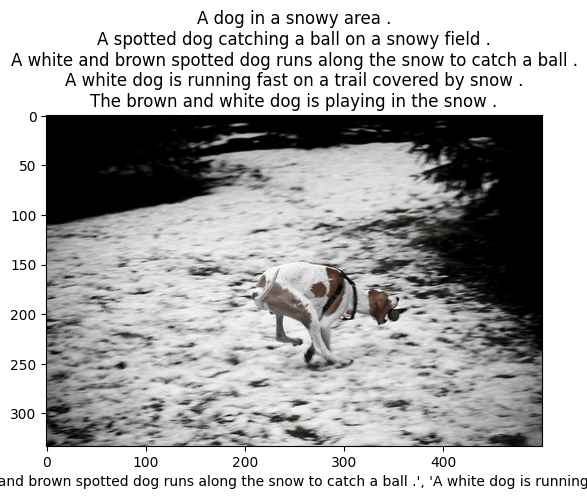

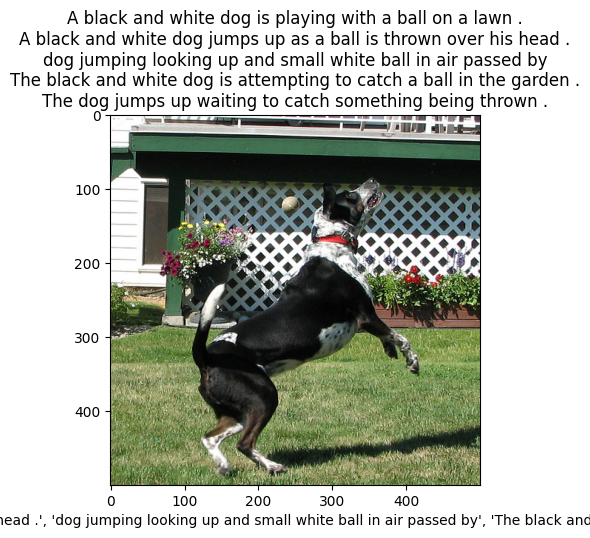

In [125]:
import matplotlib.pyplot as plt

for i in range(2):
    plt.figure()
    img_name = images[i]
    print(img_name)
    img = cv2.imread(img_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.xlabel(captions_dict[img_name.split('/')[-1]])
    plt.imshow(img)
    plt.title("\n".join(captions_dict[img_name.split('/')[-1]]))


##### Method to add start & end tag
Text preprocessing step for image captioning model.
1. converts the caption to lowercase
2. adds START and END token to captions

In [126]:

def preprocessed(txt):
    modified = txt.lower()
    modified = 'START ' + modified + ' END'
    print(modified)
    return modified

for k,v in captions_dict.items():
    for vv in v:
        captions_dict[k][v.index(vv)] = preprocessed(vv)

START a child in a pink dress is climbing up a set of stairs in an entry way . END
START a girl going into a wooden building . END
START a little girl climbing into a wooden playhouse . END
START a little girl climbing the stairs to her playhouse . END
START a little girl in a pink dress going into a wooden cabin . END
START a black dog and a spotted dog are fighting END
START a black dog and a tri-colored dog playing with each other on the road . END
START a black dog and a white dog with brown spots are staring at each other in the street . END
START two dogs of different breeds looking at each other on the road . END
START two dogs on pavement moving toward each other . END
START a little girl covered in paint sits in front of a painted rainbow with her hands in a bowl . END
START a little girl is sitting in front of a large painted rainbow . END
START a small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it . END
START there is a girl with p

# **Prepare Vocabulary**

1. Prepare count_words dictionary
2. Prepare new dictionary for encoding captions



In [127]:
count_words = {}
for k,vv in captions_dict.items():
    for v in vv:
        for word in v.split():
            if word not in count_words:
                count_words[word] = 0
            else:
                count_words[word] += 1


THRESH = -1
count = 1
new_dict = {}
for k,v in count_words.items():
    if count_words[k] > THRESH:
        new_dict[k] = count
        count += 1
len(new_dict)

# Handle unknown words predectibely
new_dict['<OUT>'] = len(new_dict)

#Backup
captions_backup = captions_dict.copy()
captions_dict = captions_backup.copy()

print(len(count_words))
print(len(new_dict))

8919
8920


**##### Encoding Captions for model to learn patterns from numerical data.**

In [128]:
for k, vv in captions_dict.items():
    for v in vv:
        encoded = []
        for word in v.split():
            if word not in new_dict:
                encoded.append(new_dict['<OUT>'])
            else:
                encoded.append(new_dict[word])


        captions_dict[k][vv.index(v)] = encoded

# **Build Generator Function**
1. Explore caption dictionary items
2. Generate X & y data set using image features & caption dictionary (Preparing the training data for the decoder model (LSTM) by creating input-output pairs from given dataset.)
3. Data from this section to be used in modelling
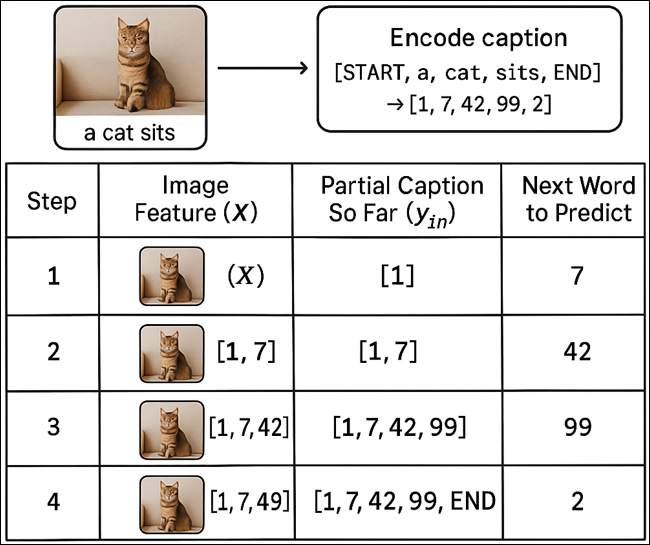

In [129]:
from tensorflow.keras.utils import to_categorical #one hot conversion
from tensorflow.keras.preprocessing.sequence import pad_sequences #same length of tokenized captions

In [130]:
MAX_LEN = 0
for k, vv in captions_dict.items():
    for v in vv:
        print(v)
        if len(v) > MAX_LEN:
            MAX_LEN = len(v) #potential bug- sushil also last line
            MAX_LEN = len(v)
            print(v)
print(MAX_LEN)

[1, 2, 3, 4, 2, 5, 6, 7, 8, 9, 2, 10, 11, 12, 4, 13, 14, 15, 16, 17]
[1, 2, 3, 4, 2, 5, 6, 7, 8, 9, 2, 10, 11, 12, 4, 13, 14, 15, 16, 17]
[1, 2, 18, 19, 20, 2, 21, 22, 16, 17]
[1, 2, 23, 18, 8, 20, 2, 21, 24, 16, 17]
[1, 2, 23, 18, 8, 25, 12, 26, 27, 24, 16, 17]
[1, 2, 23, 18, 4, 2, 5, 6, 19, 20, 2, 21, 28, 16, 17]
[1, 2, 29, 30, 31, 2, 32, 30, 33, 34, 17]
[1, 2, 29, 30, 31, 2, 35, 30, 36, 37, 38, 39, 40, 25, 41, 16, 17]
[1, 2, 29, 30, 31, 2, 42, 30, 37, 43, 44, 33, 45, 46, 38, 39, 4, 25, 47, 16, 17]
[1, 2, 29, 30, 31, 2, 42, 30, 37, 43, 44, 33, 45, 46, 38, 39, 4, 25, 47, 16, 17]
[1, 48, 49, 11, 50, 51, 52, 46, 38, 39, 40, 25, 41, 16, 17]
[1, 48, 49, 40, 53, 54, 55, 38, 39, 16, 17]
[1, 2, 23, 18, 56, 4, 57, 58, 4, 59, 11, 2, 60, 61, 37, 27, 62, 4, 2, 63, 16, 17]
[1, 2, 23, 18, 56, 4, 57, 58, 4, 59, 11, 2, 60, 61, 37, 27, 62, 4, 2, 63, 16, 17]
[1, 2, 23, 18, 7, 64, 4, 59, 11, 2, 65, 60, 61, 16, 17]
[1, 2, 66, 18, 4, 25, 67, 68, 37, 69, 4, 59, 11, 2, 42, 70, 37, 2, 61, 40, 71, 16, 17]
[1

In [131]:
Batch_size = 5000
VOCAB_SIZE = len(new_dict)

def generator(photo, caption):
    n_samples = 0

    X = []
    y_in = []
    y_out = []

    for k, vv in caption.items():
        for v in vv:
            for i in range(1, len(v)):
                X.append(photo[k][0])

                in_seq= [v[:i]]
                out_seq = v[i]

                in_seq = pad_sequences(in_seq, maxlen=MAX_LEN, padding='post', truncating='post')[0]
                out_seq = to_categorical([out_seq], num_classes=VOCAB_SIZE)[0]

                y_in.append(in_seq)
                y_out.append(out_seq)

    return X, y_in, y_out



In [132]:
print(list(captions_dict.values())[0][0])  # Should be a list of integers, not strings

X, y_in, y_out = generator(images_features, captions_dict)



[1, 2, 3, 4, 2, 5, 6, 7, 8, 9, 2, 10, 11, 12, 4, 13, 14, 15, 16, 17]


In [133]:
print(len(X), len(y_in), len(y_out))

X = np.array(X)
y_in = np.array(y_in, dtype='float64')
y_out = np.array(y_out, dtype='float64')

print(X.shape, y_in.shape, y_out.shape)
print(len(X[5]))

516878 516878 516878
(516878, 2048) (516878, 40) (516878, 8920)
2048


# **Modelling**
1. Hyper parameter tuning
2. Saving the model
3. Model after training will be used of predictions

In [134]:

from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Dropout
#from tensorflow.keras.layers.merge import add
from tensorflow.keras.layers import concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Dense, Flatten,Input, Convolution2D, Dropout, LSTM, TimeDistributed, Embedding, Bidirectional, Activation, RepeatVector,Concatenate
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras import regularizers

In [135]:
import tensorflow as tf
# def hypertuning(params):
#     print("===>", params)
#     embedding_size = params[0]
#     max_len = MAX_LEN
#     vocab_size = len(new_dict)

#     image_model = Sequential()

#     image_model.add(Dense(embedding_size, input_shape=(1000,), activation='relu',kernel_regularizer=regularizers.l1(0.01)))
# #     image_model.add(Dropout(0.25))
#     image_model.add(RepeatVector(max_len))

# #     image_model.summary()

#     language_model = Sequential()

#     language_model.add(Embedding(input_dim=vocab_size, output_dim=embedding_size, input_length=max_len))
# #     language_model.add(Dropout(0.10))
#     language_model.add(LSTM(params[1], return_sequences=True))
#     language_model.add(TimeDistributed(Dense(embedding_size)))

# #     language_model.summary()

#     #Concat image and language model
#     conca = Concatenate()([image_model.output, language_model.output])
# #     x = LSTM(128, return_sequences=True)(conca)
# #     x = LSTM(512, return_sequences=False)(x)
#     x = LSTM(params[2], activation="relu", return_sequences=True, kernel_regularizer=regularizers.l1(0.01), bias_regularizer=regularizers.l1(0.01))(conca)
#     x = LSTM(params[3], activation="relu", return_sequences=True, kernel_regularizer=regularizers.l1(0.01), bias_regularizer=regularizers.l1(0.01))(x)
#     x = LSTM(params[4], activation="relu", return_sequences=True, kernel_regularizer=regularizers.l1(0.01), bias_regularizer=regularizers.l1(0.01))(x)
#     x = LSTM(params[5], activation="relu", return_sequences=True, kernel_regularizer=regularizers.l1(0.01), bias_regularizer=regularizers.l1(0.01))(x)
#     x = LSTM(params[6], activation="relu", return_sequences=False, kernel_regularizer=regularizers.l1(0.01), bias_regularizer=regularizers.l1(0.01))(x)
#     x = Dense(vocab_size)(x)
#     out = Activation('softmax')(x)
#     model = Model(inputs=[image_model.input, language_model.input], outputs = out)

#     #Set Learning rate
#     opt = ""
#     if (params[7] == "Adam"):
#         opt = tf.keras.optimizers.Adam(learning_rate=0.01)
#     elif (params[7] == "SGD"):
#         opt = tf.keras.optimizers.SGD(learning_rate=0.01)
#     elif (params[7] == "RMSprop"):
#         opt = tf.keras.optimizers.RMSprop(learning_rate=0.01)


#     #Compiling the model
#     model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
# #     model.summary()

#     #Fitting the model
#     history = model.fit([X, y_in], y_out, batch_size=params[8], epochs=params[9], validation_split=0.2)

#     return history, model


In [ ]:
# hparams1 = [64, 128, 64, 128, 256, 512, 1024, 'RMSprop', 256, 10]
# hparams2 = [128, 256, 128, 256, 512, 256, 512, 'Adam', 256, 10]
# hparams3 = [128, 256, 128, 256, 512, 512, 512, 'SGD', 128, 10]
# hparams4 = [128, 256, 128, 256, 512, 512, 512, 'RMSprop', 128, 10]
# hparams5 = [128, 256, 128, 256, 512, 512, 512, 'RMSprop', 512, 10]

# h1, model1 = hypertuning(hparams1)
# h2, model2 = hypertuning(hparams2)
# h3, model3 = hypertuning(hparams3)
# h4, model4 = hypertuning(hparams4)
# h5, model5 = hypertuning(hparams5)

In [136]:
inv_dict = {v:k for k, v in new_dict.items()}

In [ ]:
# pd.DataFrame(h1.history).plot(figsize=(4,4), xlabel='Model Loss')
# pd.DataFrame(h2.history).plot(figsize=(4,4), xlabel='Model Loss')
# pd.DataFrame(h3.history).plot(figsize=(4,4), xlabel='Model Loss')
# pd.DataFrame(h4.history).plot(figsize=(4,4), xlabel='Model Loss')
# pd.DataFrame(h5.history).plot(figsize=(4,4), xlabel='Model Loss')

In [137]:
#sushil

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, RepeatVector, TimeDistributed, Concatenate, Activation

# Parameters
embedding_size = 128
max_len = MAX_LEN
vocab_size = len(new_dict)

# Step 1: Define image input model
image_input = Input(shape=(2048,), name="image_input")  # Input vector for image features from 2nd last layer of ResNet50
image_dense = Dense(embedding_size, activation='relu')(image_input)
image_repeated = RepeatVector(max_len)(image_dense)  # Repeat to match sequence length

#  Step 2: Define language input model
text_input = Input(shape=(max_len,), name="text_input")  # Input sequence
text_embedded = Embedding(input_dim=vocab_size, output_dim=embedding_size)(text_input)
text_lstm = LSTM(256, return_sequences=True)(text_embedded)
text_time_distributed = TimeDistributed(Dense(embedding_size))(text_lstm)

#  Step 3: Merge the image and language streams
merged = Concatenate()([image_repeated, text_time_distributed])
x = LSTM(128, return_sequences=True)(merged)
x = LSTM(512, return_sequences=False)(x)
x = Dense(vocab_size)(x)
output = Activation('softmax')(x)

#  Step 4: Define and compile the final model
model = Model(inputs=[image_input, text_input], outputs=output)
model.compile(loss='categorical_crossentropy', optimizer='RMSprop', metrics=['accuracy'])

model.summary()



Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ text_input          │ (None, 40)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_input         │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_4         │ (None, 40, 128)   │  1,141,760 │ text_input[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 128)       │    262,272 │ image_input[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_10 (LSTM)      │ (None, 40, 256)   │    394,240 │ embedding_4[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_4     │ (None, 40, 128)   │          0 │ dense_11[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_4  │ (None, 40, 128)   │     32,896 │ lstm_10[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 40, 256)   │          0 │ repeat_vector_4[… │
│ (Concatenate)       │                   │            │ time_distributed… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_11 (LSTM)      │ (None, 40, 128)   │    197,120 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_12 (LSTM)      │ (None, 512)       │  1,312,768 │ lstm_11[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 8920)      │  4,575,960 │ lstm_12[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 8920)      │          0 │ dense_13[0][0]    │
│ (Activation)        │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 7,917,016 (30.20 MB)

 Trainable params: 7,917,016 (30.20 MB)

 Non-trainable params: 0 (0.00 B)

**Model Training**

In [139]:

#  Step 5: Train the model
model.fit([X, y_in], y_out, batch_size=512, epochs=30, initial_epoch=3)

Epoch 4/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 919s 910ms/step - accuracy: 0.1190 - loss: 4.8449
Epoch 5/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 919s 910ms/step - accuracy: 0.1200 - loss: 4.7770
Epoch 6/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 918s 908ms/step - accuracy: 0.1339 - loss: 4.6400
Epoch 7/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 918s 909ms/step - accuracy: 0.2636 - loss: 3.9757
Epoch 8/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 917s 908ms/step - accuracy: 0.2907 - loss: 3.7442
Epoch 9/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 917s 908ms/step - accuracy: 0.3612 - loss: 3.3040
Epoch 10/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 916s 907ms/step - accuracy: 0.3942 - loss: 3.0406
Epoch 11/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 917s 908ms/step - accuracy: 0.4106 - loss: 2.8878
Epoch 12/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 916s 907ms/step - accuracy: 0.4234 - loss: 2.7777
Epoch 13/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 916s 907ms/step - accuracy: 0.4337 - loss: 2.6882
Epoch 14/30
1010/1010 ━━━━━━━━━━━━━━━━━━━━ 916s 907ms/step - accuracy: 0.444

In [141]:
def getImage(x):

    # test_img_path = images[x]

    test_img = cv2.imread(x)#test_img_path)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    test_img = cv2.resize(test_img, (224,224))

    test_img = np.reshape(test_img, (1,224,224,3))

    return test_img

# **Predictions**

**Download any image from google images and name that images "test1.jpg"
Keep the file in location './testimages/test1.jpg' from where code is running**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


Text(0.5, 0, ' a child sits on a dock in a boat . END')

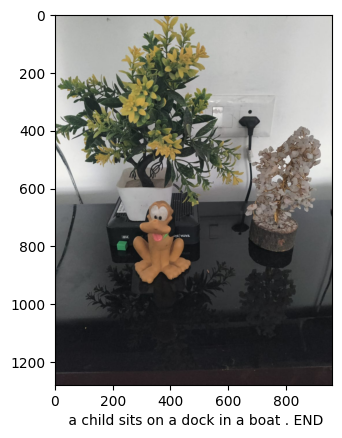

In [158]:
test_img_path = '/content/img-6.jpeg'

test_feature = incept_model.predict(getImage(test_img_path))

test_img = cv2.imread(test_img_path)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)


text_inp = ['START']

count = 0
caption = ''
while count < 25:
    count += 1

    encoded = []
    for i in text_inp:
        encoded.append(new_dict[i])

    encoded = [encoded]

    encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)


    prediction = np.argmax(model.predict([test_feature, encoded]))

    sampled_word = inv_dict[prediction]

    caption = caption + ' ' + sampled_word

    if sampled_word == 'END':
        break
    text_inp.append(sampled_word)

plt.figure()
plt.imshow(test_img)
plt.xlabel(caption)

**Automatic Video-to-Text Captioning using Key Frame Extraction and Image Captioning Model**

1	Take video as input

2	Extract key frames where content changes

3	Preprocess each frame and extract features using ResNet50

4	Use your LSTM-based decoder model to generate a caption

5	Display frame and its caption

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


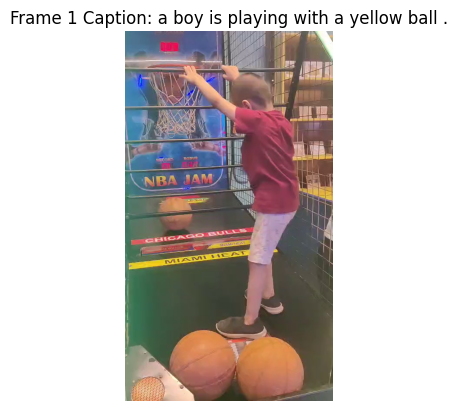

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


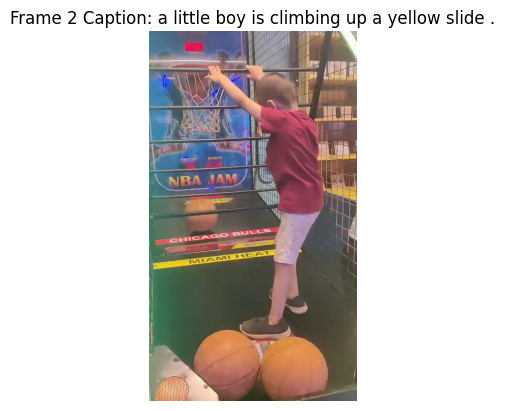

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


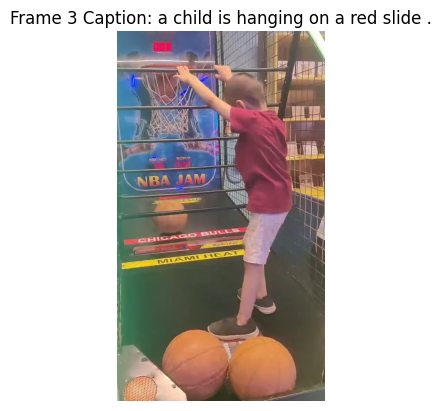

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


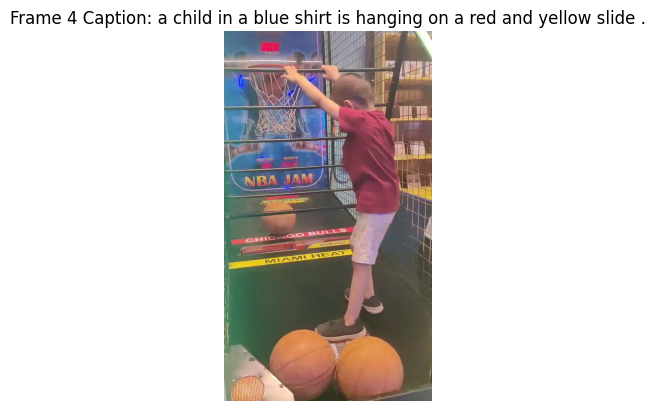

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


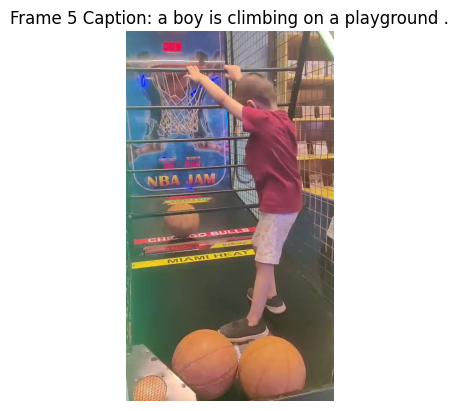

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


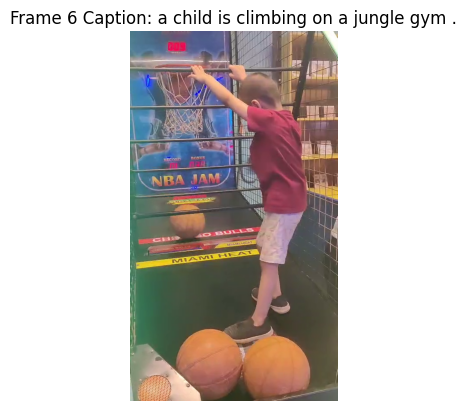

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


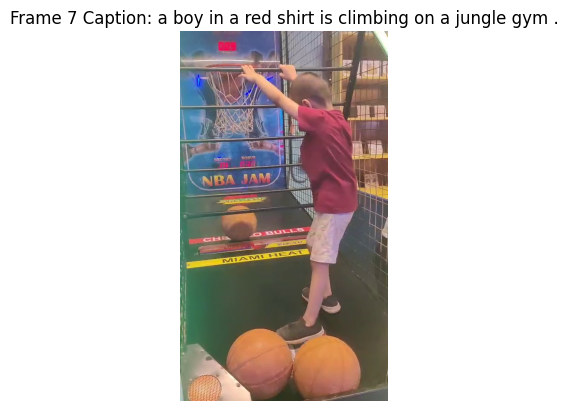

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


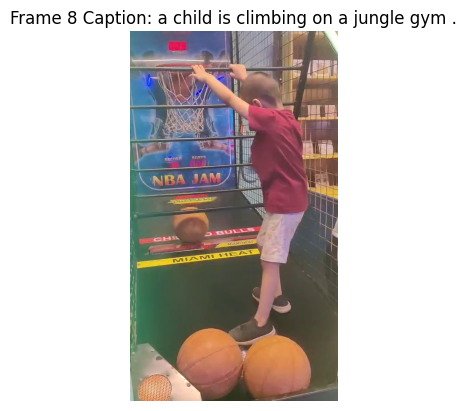

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


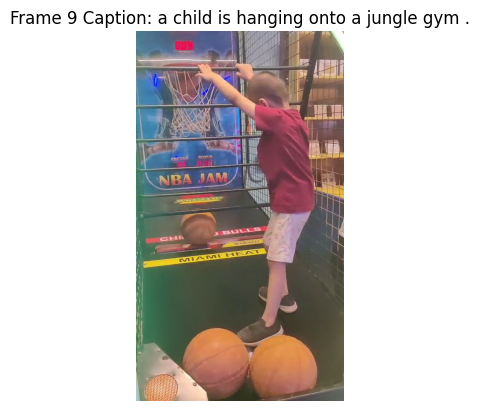

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


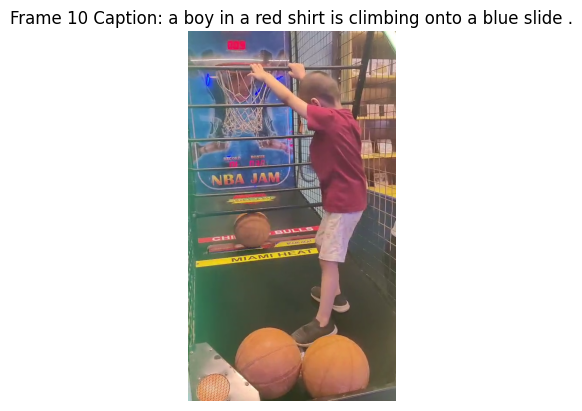

In [160]:
#import cv2
#import numpy as np
#from tensorflow.keras.preprocessing import image
#from tensorflow.keras.preprocessing.sequence import pad_sequences
#import matplotlib.pyplot as plt

# --- Helper: Convert BGR to resized normalized tensor ---
def getImage_from_frame(frame):
    img = cv2.resize(frame, (img_width, img_height))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

# --- Helper: Extract key frames from a video based on frame difference ---
def extract_key_frames(video_path, diff_threshold=200, max_frames=10):
    cap = cv2.VideoCapture(video_path)
    key_frames = []
    prev_frame = None
    count = 0

    while True:
        if len(key_frames) >= max_frames:
          break  # Stop if you've collected enough key frames

        ret, frame = cap.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        if prev_frame is None:
            prev_frame = gray
            key_frames.append(frame)
            continue

        diff = cv2.absdiff(prev_frame, gray)
        non_zero_count = np.count_nonzero(diff)

        if non_zero_count > diff_threshold * 1000:  # adjust threshold as needed
            key_frames.append(frame)
            prev_frame = gray

        count += 1
    cap.release()
    return key_frames

# --- Generate caption for each frame ---
def generate_caption_for_frame(frame):
    test_feature = incept_model.predict(getImage_from_frame(frame)).reshape(1, 2048)  # shape depends on your model

    text_inp = ['START']
    caption = ''
    count = 0

    while count < 25:
        count += 1
        encoded = [new_dict.get(w, new_dict['<OUT>']) for w in text_inp]
        encoded = pad_sequences([encoded], padding='post', truncating='post', maxlen=MAX_LEN)
        prediction = np.argmax(model.predict([test_feature, encoded]))

        if int(prediction) not in inv_dict:
            print(f" Skipping unknown prediction: {prediction}")
            sampled_word = '<UNK>'
        else:
            sampled_word = inv_dict[int(prediction)]

        caption += ' ' + sampled_word
        if sampled_word == 'END':
            break
        text_inp.append(sampled_word)

    return caption.strip(' END')


# --- Run for each frame ---
video_path = '/content/video-1.mp4'  #  Set the video file path
frames = extract_key_frames(video_path)
captions_list = []  # To store generated captions

for idx, frame in enumerate(frames):
    caption = generate_caption_for_frame(frame)
    if caption:  # Only if a valid caption is returned
        captions_list.append(f"Frame {idx+1}: {caption}")
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.imshow(rgb)
    plt.axis('off')
    plt.title(f'Frame {idx+1} Caption: {caption}')
    plt.show()


**gTTS Integration**

In [161]:
!pip install gTTS
from gtts import gTTS
audio_output_path = 'final_audio.mp3'

# --- Convert collected captions to audio ---
if captions_list:
    narration_text = " . ".join(captions_list)  # Add short pause between each
    tts = gTTS(text=narration_text, lang='en')
    tts.save("captions_audio.mp3")
    print(" Audio narration saved as 'captions_audio.mp3'")
else:
    print(" No valid captions generated. Audio not created.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 3.9 MB/s eta 0:00:00
  Attempting uninstall: click
    Found existing installation: click 8.2.1
    Uninstalling click-8.2.1:
      Successfully uninstalled click-8.2.1
 Audio narration saved as 'captions_audio.mp3'
